<a href="https://colab.research.google.com/github/SoundaryaRavi18/document-qa/blob/main/IST692_ResponsibleAI_SoundaryaRavi_MiniProject_04_12_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### IST 692 - RESPONSIBLE AI - SOUNDARYA RAVI -  MINI PROJECT

# MINI DATA SCIENCE PROJECT: Evaluating U.S. Mortgage Approval Prediction Models

## Due Date: Wednesday, April 30, by 11:59 pm

This project explores racial disparities in mortgage approvals using 2023 Home Mortgage Disclosure Act (HMDA) data from one of the largest mortgage lenders in the US - Rocket Mortgage. The dataset includes detailed loan-level information such as lender attributes, loan details, demographic factors, and socio-economic variables. Drawing on research surrounding the 1968 Fair Housing Act (FHA), this analysis evaluates systemic disparities and assesses the performance of a classification model to predict mortgage approval outcomes.<br>

Building on the coding lab exercises from Weeks 5-10, this project provides a hands-on opportunity to practice the following objectives:

* Step 1: Data Processing and Model Fitting <br>
Using HMDA data, we will preprocess and fit a logistic regression classification model similar to past exercises. The goal is to classify mortgage loan outcomes as either approved (1) or denied (0) and identify key features influencing the results.

* Step 2: Model Evaluation Metrics <br>
We will evaluate the model's performance using balanced accuracy instead of default accuracy metrics. Balanced accuracy accounts for dataset imbalances and offers a more equitable measure of predictive ability.

* Step 3: Model Interpretability <br>
Using LIME and SHAP, we will analyze feature importance both globally and locally, in order to investigate which factors most significantly influence the model's predictions.

* Step 4: Fairness Analysis <br>
Leveraging Microsoft Fairlearn, we will assess fairness across demographic groups and explore potential strategies to mitigate disparities.

* Step 5: Data Drift Evaluation <br>
Evidently will be used to analyze data drift, evaluate how well a model trained on one dataset performs on another, and diagnose implications for its predictive accuracy.

## Your Role
Throughout the project, you'll encounter sections marked "YOUR TASK," where you will either write code or provide a brief comment (2-3 sentences) to explain your approach. Once you have completed your work, save a copy of this file to your personal drive and submit a PDF version to the Project 2 Dropbox on Blackboard. Feel free to reach out if you have any questions or need help.

**Name - Soundarya Ravi<br>
SUID - 212673175<br>
Mini Project<br>
Date - 19th April 2025**
<br>
<br>

# Step 1: Data Processing and Model Fitting

All the necessary packages for this analysis have already been installed and loaded. Moving forward, you can proceed with the tools and assume everything required for the analysis is ready to use.

In [1]:
# # First, update and install the necessary packages to avoid the errors

# !apt-get -qq install -y libarchive-dev && pip install -U libarchive
# !pip install -U numpy==1.24.4
# !pip install -U seaborn matplotlib lime shap scikit-learn tensorflow fairlearn evidently

# # Import the required libraries
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler
# from sklearn.linear_model import LogisticRegression
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import accuracy_score, roc_auc_score
# from sklearn.pipeline import Pipeline
# from sklearn.utils import Bunch
# from sklearn.metrics import (
#     balanced_accuracy_score,
#     accuracy_score,
#     recall_score,
#     confusion_matrix,
#     roc_auc_score,
#     roc_curve,
#     RocCurveDisplay
# )

# import shap
# import lime
# import lime.lime_tabular
# from lime.lime_tabular import LimeTabularExplainer

# from fairlearn.metrics import (
#     MetricFrame,
#     true_positive_rate,
#     false_positive_rate,
#     false_negative_rate,
#     selection_rate,
#     count,
#     false_negative_rate_difference
# )

# from fairlearn.postprocessing import ThresholdOptimizer, plot_threshold_optimizer
# from fairlearn.reductions import ExponentiatedGradient, EqualizedOdds, TruePositiveRateParity

# import evidently
# from evidently.report import Report
# from evidently.metrics.base_metric import generate_column_metrics
# from evidently.metric_preset import DataDriftPreset, TargetDriftPreset, DataQualityPreset, RegressionPreset
# from evidently.metrics import *
# from evidently.test_suite import TestSuite
# from evidently.tests.base_test import generate_column_tests
# from evidently.test_preset import DataStabilityTestPreset, NoTargetPerformanceTestPreset, RegressionTestPreset
# from evidently.tests import *

# from IPython import display
# from datetime import date

# # Set display options
# pd.set_option("display.float_format", "{:.2f}".format)
# sns.set()

# # Handle warnings related to numpy deprecations
# import warnings
# warnings.filterwarnings('ignore', category=FutureWarning)

In [1]:
# =============================================================================
# 1) INSTALL DEPENDENCIES (then RESTART RUNTIME)
# =============================================================================
# libarchive is only needed if you plan to use Evidently’s archive features
!apt-get -qq update && apt-get install -qq -y libarchive-dev

!pip install --upgrade pip
!pip install \
    libarchive \
    numpy==1.26.1 \
    seaborn==0.13.2 \
    matplotlib==3.6.3 \
    scikit-learn==1.6.1 \
    tensorflow==2.18.0 \
    lime==0.2.0.1 \
    shap==0.47.2 \
    fairlearn==0.12.0 \
    evidently==0.2.8


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
  Using cached matplotlib-3.6.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.8 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 77.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 77.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.10.1
    Uninstalling matplotlib-3.10.1:
      Successfully uninstalled matplotlib-3.10.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you 

In [1]:
# =============================================================================
# 2) IMPORTS
# =============================================================================
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    balanced_accuracy_score,
    recall_score,
    confusion_matrix,
    roc_curve,
    RocCurveDisplay
)

import shap
import lime
from lime.lime_tabular import LimeTabularExplainer

from fairlearn.metrics import (
    MetricFrame,
    true_positive_rate,
    false_positive_rate,
    false_negative_rate,
    selection_rate,
    count,
    false_negative_rate_difference
)
from fairlearn.postprocessing import ThresholdOptimizer, plot_threshold_optimizer
from fairlearn.reductions import ExponentiatedGradient, EqualizedOdds, TruePositiveRateParity

import evidently
from evidently.report import Report
from evidently.metrics.base_metric import generate_column_metrics
from evidently.metric_preset import DataDriftPreset, TargetDriftPreset, DataQualityPreset, RegressionPreset
from evidently.metrics import *
from evidently.test_suite import TestSuite
from evidently.tests.base_test import generate_column_tests
from evidently.test_preset import (
    DataStabilityTestPreset,
    NoTargetPerformanceTestPreset,
    RegressionTestPreset
)
from evidently.tests import *

# Display settings
pd.set_option("display.float_format", "{:.2f}".format)
sns.set()

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)


## Load the dataset


We'll start by loading the dataset:

In [2]:
df = pd.read_csv("https://respai.s3.us-east-2.amazonaws.com/rocket+mortgage_pr.csv")

Let's take a closer look at its structure. To better understand each variable and its values, please take a moment to review the data dictionary available here: https://ffiec.cfpb.gov/documentation/publications/modified-lar/modified-lar-schema

In [3]:
df.head()

,activity_year,lei,derived_msa-md,state_code,county_code,census_tract,conforming_loan_limit,derived_loan_product_type,derived_dwelling_category,derived_ethnicity,...,denial_reason-2,denial_reason-3,denial_reason-4,tract_population,tract_minority_population_percent,ffiec_msa_md_median_family_income,tract_to_msa_income_percentage,tract_owner_occupied_units,tract_one_to_four_family_homes,tract_median_age_of_housing_units
0,2023,549300FGXN1K3HLB1R50,41884,CA,6081.00,6081608700.00,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,...,NaN,NaN,NaN,7670,49.74,173200,161.06,1842,1940,58
1,2023,549300FGXN1K3HLB1R50,26420,TX,48201.00,48201452900.00,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,...,NaN,NaN,NaN,4274,93.19,94100,67.84,808,1264,47
2,2023,549300FGXN1K3HLB1R50,16984,IL,17043.00,17043846521.00,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,...,NaN,NaN,NaN,5036,24.32,109800,195.14,1606,1760,31
3,2023,549300FGXN1K3HLB1R50,42644,WA,53033.00,53033032325.00,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,...,NaN,NaN,NaN,7196,57.52,146500,105.26,1153,1765,30
4,2023,549300FGXN1K3HLB1R50,40220,VA,51161.00,51161030300.00,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Not Hispanic or Latino,...,NaN,NaN,NaN,7288,10.30,90900,113.53,2550,2854,44


To prepare the dataset for analysis, we will preprocess the data using the following steps, adapted from Ray Carpenter’s (2022) study, "Measuring Race and Ethnicity Gaps in U.S. Mortgage Approvals": https://econ.unc.edu/wp-content/uploads/sites/38/2022/09/Measuring-Race-and-Ethnicity-Gaps-in-U.S-Mortgage-Approvals.pdf:

## Data Cleaning and Preparation <br>
* Only **home purchase loans** will be included in the analysis. Loan types such as home improvements, refinancing, cash-out refinancing, other purposes, and "not applicable" have already been excluded from the dataset.

* The **outcome variable**, "Approval," will be binary:

 - 1: Includes approved loans and applications approved but not accepted.
 - 0: Includes denied applications.
Other cases (e.g., withdrawals, incompleteness, and pre-approval requests) will be excluded from the analysis.



In [4]:
# Map categories to binary outcome (approval or denial)
approval_mapping = {
    1: 1,  # Loan originated (approved)
    2: 1,  # Application approved but not accepted (approved)
    3: 0,  # Application denied (denied)
}

# Apply the mapping to create the binary 'approval' variable
df['approval'] = df['action_taken'].map(approval_mapping)

# Drop rows where 'approval' is None (irrelevant categories)
df = df.dropna(subset=['approval'])

df['approval'] = df['approval'].astype(int)

* Race Grouping: The race variable will be grouped into four categories: White, Asian, Black, and Other, where:

 - Asian: Includes Indian, Chinese, Filipino, Japanese, Korean, Vietnamese, and Other Asian races.
 - Other: Includes applicants who do not fit into the above categories.

Any observations where race was not recorded have been removed from the dataset in advance.


In [5]:
race_mapping = {
    1: 'Other',  # American Indian or Alaska Native
    2: 'Asian',  # General Asian category
    23: 'Asian',  # Filipino
    26: 'Asian',  # Vietnamese
    3: 'Black',  # Black or African American
    4: 'Other',  # Native Hawaiian or Other Pacific Islander
    5: 'White',  # White
}

# Apply the mapping to the applicant_race-1 column
df['race_grouped'] = df['applicant_race-1'].map(race_mapping)

# Drop rows where race_grouped is None (missing or not recorded)
df = df.dropna(subset=['race_grouped'])

* Variable Selection: The variables included in the model have been selected based on their economic importance and relevance to the analysis. These include demographic, socio-economic, and loan-specific attributes:



In [6]:
relevant_columns = [
    'approval',  # Outcome variable
    'race_grouped',
    'loan_to_value_ratio',
    'state_code',
    'applicant_sex',
    'income',
    'loan_amount',
    'preapproval',
    'loan_type',
    'occupancy_type'
]

# Filter the dataset to keep only the relevant columns
df = df[relevant_columns]



Many real-world variables, such as income and loan amounts, tend to have a right-skewed distribution (a long tail of larger values). Log transformation compresses these large values and creates a distribution that is closer to normal, which is often a key assumption in many modeling techniques.

 - Log Income: Created by taking the logarithm of the income variable to better capture its relationship with loan approvals. Observations where income was missing, zero, or negative (likely data entry errors) will be removed.
 - Log Loan Amount: Created using the same process as log income but applied to the loan amount column.


In [7]:
# Apply logarithmic transformation to income and loan amount
df['log_income'] = np.log(df['income'].replace(0, np.nan))  # Handle zero values
df['log_loan_amount'] = np.log(df['loan_amount'].replace(0, np.nan))  # Handle zero values

# Drop the original columns after transformation
df = df.drop(columns=['income', 'loan_amount'])

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Including 50 one-hot encoded state variables in your logistic regression model can lead to issues such as:

- High Dimensionality: Adding many binary features increases the model's complexity, computational cost, and difficulty in converging.
- Multicollinearity: Even with one-hot encoding, correlated features among states can affect interpretability and performance.
- Overfitting: Limited data for some states can cause the model to fit noise rather than general trends.

To address this, we will group states into broader regions (e.g., Northeast, Midwest, South, West) using U.S. Census Bureau classifications.

In [8]:
state_to_region = {
    'AL': 'South', 'AK': 'West', 'AZ': 'West', 'AR': 'South', 'CA': 'West',
    'CO': 'West', 'CT': 'Northeast', 'DE': 'South', 'FL': 'South', 'GA': 'South',
    'HI': 'West', 'ID': 'West', 'IL': 'Midwest', 'IN': 'Midwest', 'IA': 'Midwest',
    'KS': 'Midwest', 'KY': 'South', 'LA': 'South', 'ME': 'Northeast', 'MD': 'South',
    'MA': 'Northeast', 'MI': 'Midwest', 'MN': 'Midwest', 'MS': 'South', 'MO': 'Midwest',
    'MT': 'West', 'NE': 'Midwest', 'NV': 'West', 'NH': 'Northeast', 'NJ': 'Northeast',
    'NM': 'West', 'NY': 'Northeast', 'NC': 'South', 'ND': 'Midwest', 'OH': 'Midwest',
    'OK': 'South', 'OR': 'West', 'PA': 'Northeast', 'RI': 'Northeast', 'SC': 'South',
    'SD': 'Midwest', 'TN': 'South', 'TX': 'South', 'UT': 'West', 'VT': 'Northeast',
    'VA': 'South', 'WA': 'West', 'WV': 'South', 'WI': 'Midwest', 'WY': 'West', 'DC': 'South'
}
df['region'] = df['state_code'].map(state_to_region)

In [9]:
df = df.dropna()

In [10]:
len(df)

107962

This concludes the preprocessing steps. This approach ensures consistency with existing literature and sets up a robust foundation for building and evaluating the classification model.

In [11]:
df

,approval,race_grouped,loan_to_value_ratio,state_code,applicant_sex,preapproval,loan_type,occupancy_type,log_income,log_loan_amount,region
0,1,Asian,80.00,CA,2,2,1,1,4.80,13.03,West
1,1,Asian,95.00,TX,1,2,1,1,4.17,12.23,South
2,1,White,97.00,IL,2,2,1,1,4.34,12.56,Midwest
3,1,Asian,85.00,WA,1,1,1,1,5.08,13.28,West
4,1,White,80.00,VA,1,2,1,1,3.69,12.13,South
...,...,...,...,...,...,...,...,...,...,...,...
109400,0,White,86.00,MI,1,2,1,3,5.27,12.52,Midwest
109401,0,White,70.00,CA,2,2,1,1,5.41,13.49,West
109402,0,White,75.00,CA,1,2,1,1,6.71,13.49,West
109403,0,White,97.00,FL,2,2,1,1,3.83,11.74,South


We can now save a list of all categorical features:

In [12]:
categorical_features = [
    'race_grouped',
    'state_code',
    'applicant_sex',
    'preapproval',
    'loan_type',
    'occupancy_type'
]

for col_name in categorical_features:
    df[col_name] = df[col_name].astype('category')

## Descriptive Statistics

In [13]:
df["approval"].value_counts(normalize=True)

,proportion
approval,
1,0.87
0,0.13


The outcome variable is imbalanced: most loan applications in the dataset were approved (approval = 1). To ensure effective model training, we will resample the training set, similar to how we handled the healthcare dataset earlier in the course.

## YOUR TASK:

Create a similar frequency distribution table to display the proportions of each race category in the dataset based on the newly created race_grouped variable.

In [14]:
## YOUR TASK:
df['race_grouped'].value_counts(normalize=True)

,proportion
race_grouped,
White,0.75
Asian,0.13
Black,0.11
Other,0.01


## YOUR TASK:

Provide a brief comment reflecting on the observed distribution.

[YOUR COMMENT]
<br>
The race distribution in our sample is quite imbalanced: about three‑quarters of applicants (75%) identify as White, while Asians and Blacks make up only around 13% and 11% respectively, and all other groups just 1%. This suggests that our model will see far more examples from White applicants, which could lead it to learn patterns that don’t generalize as well for smaller groups. We should keep this imbalance in mind when interpreting performance and fairness metrics, since underrepresented groups may have less reliable predictions. ​This might lead to bias against the under-represented community or the marginalized communities.

# Training the initial models

## Prepare training and test datasets

As noted earlier, our target variable is **approval**, and our sensitive feature is **race_grouped**.


In [15]:
target_variable = "approval"
demographic = ["race_grouped", "applicant_sex"]
sensitive = ["race_grouped"]

In [16]:
Y = df.loc[:, target_variable]

Some of our variables are binary but their values are 1 and 2 instead of 0 and 1, so we will need to adjust those variables before proceeding. Specifically, the following step converts 1 and 2 into 0 and 1:

In [17]:
binary_columns = ["preapproval", "applicant_sex"]
for col in binary_columns:
    df[col] = df[col].astype(int) - 1

Next, we drop the features that won’t be used in the model, such as the outcome variable, the original state_code variable, and the sensitive feature. We also convert the categorical features into 0/1 indicators using one-hot encoding ("dummies").

In [18]:
X = pd.get_dummies(df.drop(columns=[
    "race_grouped",
    "approval",
    "state_code"
]))

In [19]:
X

,loan_to_value_ratio,applicant_sex,preapproval,log_income,log_loan_amount,loan_type_1,loan_type_2,loan_type_3,occupancy_type_1,occupancy_type_2,occupancy_type_3,region_Midwest,region_Northeast,region_South,region_West
0,80.00,1,1,4.80,13.03,True,False,False,True,False,False,False,False,False,True
1,95.00,0,1,4.17,12.23,True,False,False,True,False,False,False,False,True,False
2,97.00,1,1,4.34,12.56,True,False,False,True,False,False,True,False,False,False
3,85.00,0,0,5.08,13.28,True,False,False,True,False,False,False,False,False,True
4,80.00,0,1,3.69,12.13,True,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109400,86.00,0,1,5.27,12.52,True,False,False,False,False,True,True,False,False,False
109401,70.00,1,1,5.41,13.49,True,False,False,True,False,False,False,False,False,True
109402,75.00,0,1,6.71,13.49,True,False,False,True,False,False,False,False,False,True
109403,97.00,1,1,3.83,11.74,True,False,False,True,False,False,False,False,True,False


Now it's time to split the dataset into training and testing sets. To ensure that the results are replicable, we’ll set a random seed during the split. This guarantees that every time the code is run, the data is divided in the same way, which makes it easier to validate and compare results consistently.

In [20]:
random_seed = 123
np.random.seed(random_seed)

In [21]:
X_train, X_test, Y_train, Y_test, df_train, df_test = train_test_split(
    X,
    Y,
    df,
    test_size=0.20,
    stratify=Y,
    random_state=random_seed
)

As we have done before, for the purposes of training (but not evaluation) we will resample the data set, so that it has the same number of positive and negative examples.


Because we are downsampling the number of positive examples, we create a training dataset with a significantly lower number of data points. For more complex machine learning models, this lower number of training data points may affect the model's accuracy.

In [22]:
def resample_dataset(X_train, Y_train):

  negative_ids = Y_train[Y_train == 0].index
  positive_ids = Y_train[Y_train == 1].index
  balanced_ids = positive_ids.union(np.random.choice(a=negative_ids, size=len(positive_ids)))

  X_train = X_train.loc[balanced_ids, :]
  Y_train = Y_train.loc[balanced_ids]
  return X_train, Y_train

In [23]:
X_train_bal, Y_train_bal = resample_dataset(X_train, Y_train)

We next evaluate the descriptive statistics of the training and test datasets.

Text(0.5, 1.0, 'Target Label Histogram for Test Dataset')

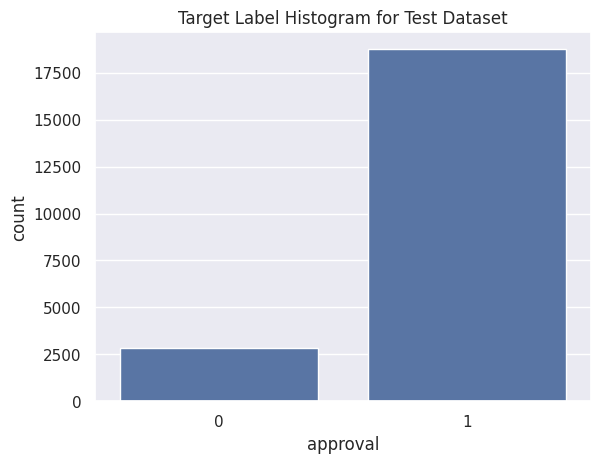

In [24]:
sns.countplot(x=Y_test)
plt.title("Target Label Histogram for Test Dataset")

## YOUR TASK:

Generate a similar plot for Y_train_bal and comment on the distribution of 0s and 1s in it.

Text(0.5, 1.0, 'Target Label Histogram for Train Dataset')

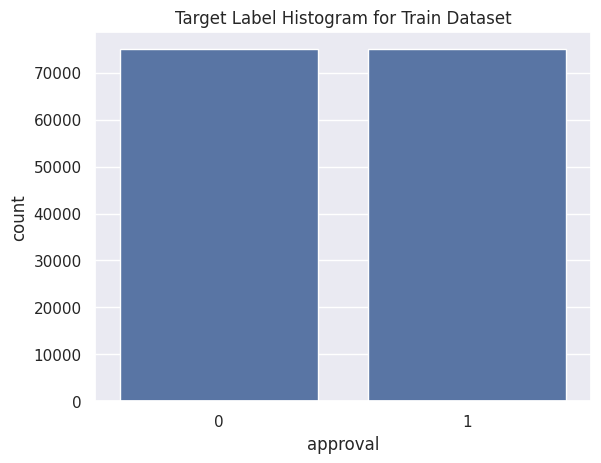

In [25]:
sns.countplot(x=Y_train_bal)
plt.title("Target Label Histogram for Train Dataset")

[YOUR COMMENT]
<br>
The histogram shows that after down‑sampling, the training set contains almost exactly the same number of denied (0) and approved (1) applications around 75,000 examples of each. This confirms that our resampling step successfully created a balanced dataset, which should help the model learn equally from both classes and avoid bias toward the majority class.  

## Train the logistic regression model

We are now ready to train a logistic regression model and save its predictions on test data for analysis.

In [26]:
pipeline = Pipeline(steps=[
    ("preprocessing", StandardScaler()),
    ("logistic_regression", LogisticRegression(max_iter=1000))
])

In [27]:
pipeline.fit(X_train_bal, Y_train_bal)

Pipeline(steps=[('preprocessing', StandardScaler()),
                ('logistic_regression', LogisticRegression(max_iter=1000))])

In [28]:
Y_pred_proba = pipeline.predict_proba(X_test)[:,1]
Y_pred = pipeline.predict(X_test)

# Step 2: Model Evaluation Metrics

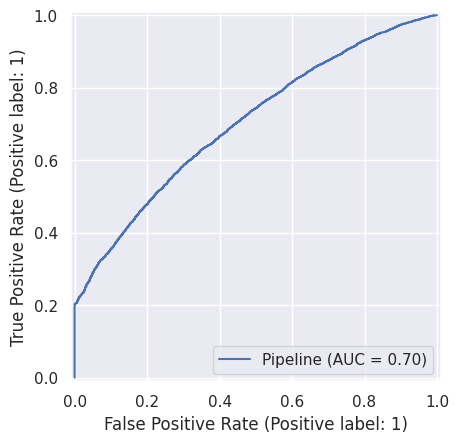

In [29]:
RocCurveDisplay.from_estimator(pipeline, X_test, Y_test);

## YOUR TASK:

Show the model's balanced accuracy, as we practiced in the lab notebooks during Weeks 5-7:

In [30]:
balanced_accuracy_score(Y_test,Y_pred)

0.6404495937926926

#Step 3: Model Interpretability - LIME & SHAP

Next, we'll assess the interpretability of the model's predictions using LIME and SHAP. To begin, we'll display the model's prediction for the 3rd loan application in the test set, which corresponds to the row with an index of 2 (remember, Python uses zero-based indexing).

In [31]:
pipeline.predict([X_test.iloc[2].values])[0]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


0

We can now generate a local explanation for this particular observation using LIME:

In [32]:
# Initialize LIME explainer with training data
explainer_lime_lr = LimeTabularExplainer(X_train_bal.values,
                                      feature_names=X_train_bal.columns,
                                      class_names=["Not Approved","Approved"],
                                      discretize_continuous=True)

# Generate LIME explanation for a single instance (e.g., third row in X_test)
lime_exp_lr = explainer_lime_lr.explain_instance(X_test.iloc[2].values, pipeline.predict_proba, num_features=20)

lime_exp_lr.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


## YOUR TASK:
Create a similar plot for the 150th loan application in the test set and briefly discuss which features appear to have the most significant influence on that specific prediction. Based on the LIME output, was this application predicted to be approved?

In [33]:
pipeline.predict([X_test.iloc[149].values])[0]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


1

In [34]:
# Initialize LIME explainer with training data
explainer_lime_lr = LimeTabularExplainer(X_train_bal.values,
                                      feature_names=X_train_bal.columns,
                                      class_names=["Not Approved","Approved"],
                                      discretize_continuous=True)

# Generate LIME explanation for a single instance (e.g., third row in X_test)
lime_exp_lr = explainer_lime_lr.explain_instance(X_test.iloc[149].values, pipeline.predict_proba, num_features=20)

lime_exp_lr.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


[YOUR COMMENT]
<br>
The model’s pipeline.predict returned **1** for this instance, confirming an **Approved** decision. LIME breaks down why:

For the 150th application, the LIME explanation shows the model predicted **Approved** (55% vs. 45%). The LIME plot breaks down how each feature shifted the probability:

- **Biggest positive drivers (orange):**  
  - `occupancy_type_2 = 0` contributed ~0.06  
  - `region_Northeast = 0` contributed ~0.04  
  - `occupancy_type_3 = 0` and `loan_type_2 = 0` each added ~0.03  
  - `loan_to_value_ratio` below its threshold added ~0.03  

- **Smaller positive boosts:**  
  - `loan_type_1 = 1` (+0.02)  
  - `region_West = 1` (+0.02)  
  - `log_income` in its mid‑range (+0.02)  

- **Negative drivers (blue):**   
  - `region_Midwest = 0` subtracted ~0.02
  - `loan_type_3 = 0` contributed ~0.04   
  - `log_loan_amount > 12.56` subtracted ~0.01  

Because the sum of all orange bars outweighs the blue ones, the final prediction is **Approved**.  

For this 150th borrower, the raw feature values tell the story:

- **Loan‑to‑value ratio = 75%**  
  A moderate LTV (75%) signals they’re putting 25% down, which reduces lender risk and gives a strong positive boost.

- **Loan amount ≈ \$386 000** (`log_loan_amount = 12.86`)  
  Even though this is a sizeable mortgage, the model views it positively when they get paired.

- **Income ≈ \$115 000** (`log_income = 4.75`)  
  A solid income level shows ample repayment capacity, further tipping the scales toward approval.

- **Loan type = 1** and **Region = West**  
  A conventional loan in the Western U.S. adds small additional support, consistent with typical regional and product performance.

- **Applicant sex = 1** (male), **Occupancy type 2 = 0**, **Loan type 3 = 0**, **Region Midwest = 0**, etc.  
  These “zero” values neither strongly help nor hurt; they simply fill out the profile without dragging down the score.

In the LIME plot, the orange bars for LTV, income, loan type, and region together outweigh the minor blue (negative) bars from factors like Midwest region and larger-than-average loan size. That cumulative effect produces an overall **Approved** prediction (55% vs. 45%), reflecting a borrower with good equity, healthy income, and a conventional mortgage profile.  




Next, we will take a look at SHAP's global explanation technique, which offers a comprehensive overview of the relative importance of features across the entire dataset. Unlike local explanations, which focus on understanding individual predictions, global explanations help us identify patterns and trends in how specific features influence the model's predictions overall. This allows us to better understand the broader decision-making process of the model and pinpoint which features consistently have the most significant impact on predictions. Let's use SHAP to visualize these global insights and evaluate the role of each feature in shaping the model's outputs.

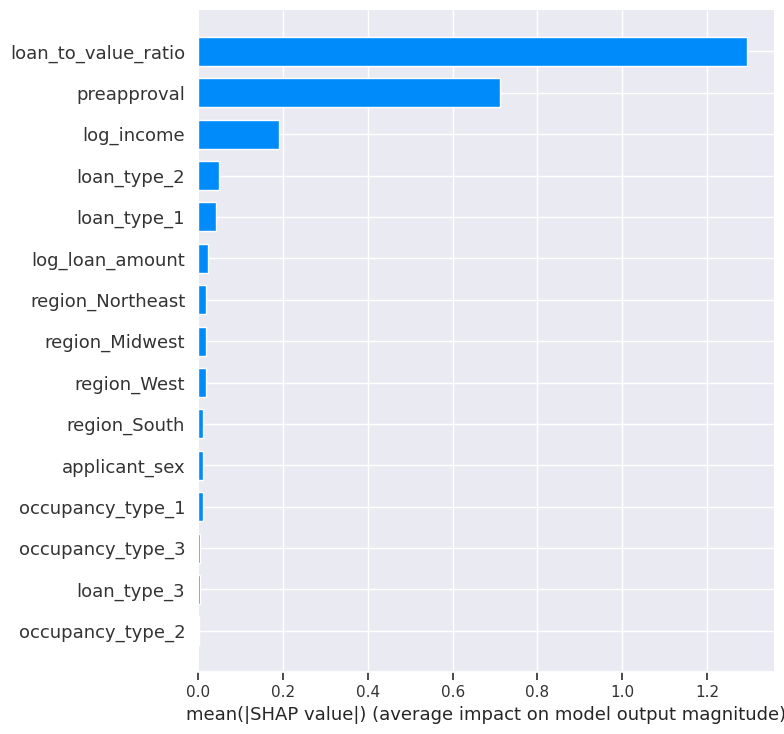

In [35]:
logistic_model = pipeline.named_steps["logistic_regression"]
explainer_shap_lr = shap.LinearExplainer(logistic_model, X_train_bal)
shap_values_lr = explainer_shap_lr.shap_values(X_test)
shap.summary_plot(shap_values_lr, X_test, plot_type="bar")

## YOUR TASK:
Analyze the SHAP summary plot above and identify the top three features that most strongly influence loan approval predictions in the model. These features represent the factors that consistently have the greatest impact on the model's decision-making across the entire dataset. Briefly discuss these key features in the context of the dataset.

[YOUR COMMENT]
<br>
The SHAP summary plot quantifies each feature’s average influence on the approval prediction. The top three are:

- **loan_to_value_ratio (mean |SHAP| ≈ 1.30)**  
  This is by far the strongest driver. A lower loan‑to‑value ratio (more borrower equity) consistently pushes the model toward approval, which aligns with lending practice that lower LTV signals lower risk.

- **preapproval (mean |SHAP| ≈ 0.72)**  
  Being pre‑approved before applying has a large positive effect on the prediction. The model treats preapproval as a clear indicator of creditworthiness, so its presence increases approval probability substantially.

- **log_income (mean |SHAP| ≈ 0.19)**  
  Higher logged income also boosts approval odds, reflecting the intuitive link between borrower earnings and their ability to repay a mortgage.

All other features : loan_type_2 (≈ 0.06), loan_type_1 (≈ 0.04), log_loan_amount (≈ 0.02), region indicators, occupancy types, and applicant_sex (all ≲ 0.01) play only minor roles. This tells me that our model is relying primarily on core financial risk factors (equity, preapproval status, and income) rather than on loan purpose or demographic details.  

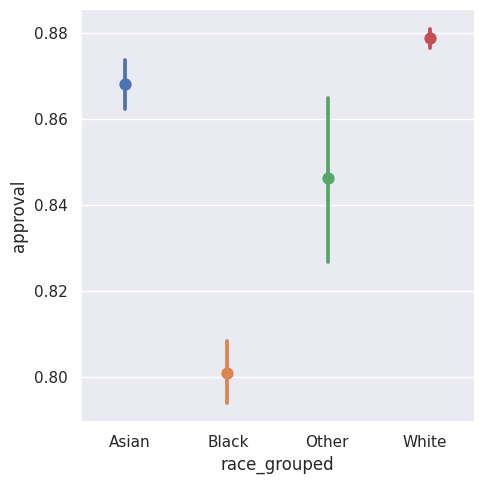

In [36]:
sns.catplot(y="approval", x="race_grouped", hue="race_grouped", data=df,
            kind="point", dodge=True, errorbar=('ci', 95), linestyle='none');

Looking at the plot above, there appear to be some discrepancies - albeit small, as indicated by the truncated y-axis - between the different racial categories in the overall dataset.

Let's take a closer look by examining how our trained model performs across different racial groups. The code below, adapted from the Week 5 lab notebook on Fairlearn, focuses solely on the false negative rate. To expand the analysis, refer back to that notebook, find the section that evaluates multiple fairness metrics, and apply those metrics to the test set here to gain a more comprehensive understanding of the model's performance.

In [37]:
# In its simplest form MetricFrame takes four arguments:
#    metric_function with signature metric_function(y_true, y_pred)
#    y_true: array of labels
#    y_pred: array of predictions
#    sensitive_features: array of sensitive feature values

mf1 = MetricFrame(metrics=false_negative_rate,
                  y_true=Y_test,
                  y_pred=Y_pred,
                  sensitive_features=df_test['race_grouped'])

# The disaggregated metrics are stored in a pandas Series mf1.by_group:
mf1.by_group

,false_negative_rate
race_grouped,
Asian,0.38
Black,0.62
Other,0.55
White,0.46


## YOUR TASK:

Create a table to assess multiple fairness metrics in the same table using Fairlearn, as explained above, and briefly analyze the results.

In [39]:
from fairlearn.metrics import MetricFrame, false_negative_rate, true_positive_rate
from sklearn.metrics import recall_score, accuracy_score

# Define the fairness metrics to calculate
metrics = {
    "False Negative Rate": false_negative_rate,
    "True Positive Rate": true_positive_rate,
    "Recall": recall_score,
    "Accuracy": accuracy_score
}

# Create the MetricFrame
mf = MetricFrame(
    metrics=metrics,
    y_true=Y_test,
    y_pred=Y_pred,
    sensitive_features=df_test['race_grouped']
)

# Display the table of metrics by race group
print(mf.by_group)


              False Negative Rate  True Positive Rate  Recall  Accuracy
race_grouped                                                           
Asian                        0.38                0.62    0.62      0.62
Black                        0.62                0.38    0.38      0.48
Other                        0.55                0.45    0.45      0.51
White                        0.46                0.54    0.54      0.57


[YOUR COMMENT]
<br>
The fairness table reveals a worrying gap in model performance across racial groups. Black applicants face a **62% false negative rate**, meaning the model wrongly denies over half of the loans it should approve. By contrast, Asian applicants see a much lower 38% false negative rate. Black borrowers also have the lowest true positive rate (0.38) and the lowest overall accuracy (0.48). White and “Other” applicants fall in between, with White applicants at 46% false negatives and 57% accuracy, and Other applicants at 55% false negatives and 51% accuracy. Asian applicants enjoy the best performance (38% false negatives, 62% accuracy).  

These disparities indicate that our model is systematically less accurate for Black applicants. To make the lending process fairer, we’ll need to explore bias mitigation strategies such as adjusting decision thresholds by group or applying a fairness‐aware learning algorithm. So that no single demographic group is unduly disadvantaged.  









# Evaluating Data Drift with Evidently

In the final step of our analysis, we will evaluate data drift to ensure that a model trained on data from a specific year remains effective when applied to unseen data from subsequent years. Data drift occurs when the statistical properties of the features or target variable change over time, whcih can reduce the model's accuracy and fairness.

To investigate this, the code below loads and preprocesses a similar Rocket Mortgage nationwide dataset on mortgage applications, but from 2024. Using this data, we will evaluate whether the model trained on 2023 data is still reliable and relevant. Using the Evidently library, as we did in Lab Notebook 9, we can systematically compare feature distributions and model predictions between the two datasets.

This step is critical in identifying potential shifts in data distribution or feature relationships over time to ensure that our model remains robust and adaptable to new scenarios.

### Specify Reference & Current Data to Evidently

In [40]:
df_current = pd.read_csv("https://respai.s3.us-east-2.amazonaws.com/rocket_mortgage-new.csv")

approval_mapping = {
    1: 1,
    2: 1,
    3: 0,
}

df_current['approval'] = df_current['action_taken'].map(approval_mapping)
df_current = df_current.dropna(subset=['approval'])
df_current['approval'] = df_current['approval'].astype(int)

race_mapping = {
        1: 'Other',  # American Indian or Alaska Native
        2: 'Asian',  # General Asian category
        21: 'Asian',  # Asian Indian
        22: 'Asian',  # Chinese
        23: 'Asian',  # Filipino
        24: 'Asian',  # Japanese
        25: 'Asian',  # Korean
        26: 'Asian',  # Vietnamese
        27: 'Asian',  # Other Asian
        3: 'Black',  # Black or African American
        4: 'Other',  # Native Hawaiian or Other Pacific Islander
        41: 'Other',  # Native Hawaiian
        42: 'Other',  # Guamanian or Chamorro
        43: 'Other',  # Samoan
        44: 'Other',  # Other Pacific Islander
        5: 'White',  # White
        6: None,  # Information not provided (drop these rows later)
        7: None   # Not applicable (drop these rows later)
    }


df_current['race_grouped'] = df_current['applicant_race-1'].map(race_mapping)
df_current = df_current.dropna(subset=['race_grouped'])

relevant_columns = [
    'approval',
    'race_grouped',
    'loan_to_value_ratio',
    'state_code',
    'applicant_sex',
    'income',
    'loan_amount',
    'preapproval',
    'loan_type',
    'occupancy_type'
]

df_current = df_current[relevant_columns]
df_current = df_current.dropna()
df_current['log_income'] = np.log(df_current['income'].replace(0, np.nan))
df_current['log_loan_amount'] = np.log(df_current['loan_amount'].replace(0, np.nan))
df_current = df_current.drop(columns=['income', 'loan_amount'])

categorical_features = [
    'race_grouped',
    'state_code',
    'applicant_sex',
    'preapproval',
    'loan_type',
    'occupancy_type'
]

for col_name in categorical_features:
    df_current[col_name] = df_current[col_name].astype('category')

state_to_region = {
    'AL': 'South', 'AK': 'West', 'AZ': 'West', 'AR': 'South', 'CA': 'West',
    'CO': 'West', 'CT': 'Northeast', 'DE': 'South', 'FL': 'South', 'GA': 'South',
    'HI': 'West', 'ID': 'West', 'IL': 'Midwest', 'IN': 'Midwest', 'IA': 'Midwest',
    'KS': 'Midwest', 'KY': 'South', 'LA': 'South', 'ME': 'Northeast', 'MD': 'South',
    'MA': 'Northeast', 'MI': 'Midwest', 'MN': 'Midwest', 'MS': 'South', 'MO': 'Midwest',
    'MT': 'West', 'NE': 'Midwest', 'NV': 'West', 'NH': 'Northeast', 'NJ': 'Northeast',
    'NM': 'West', 'NY': 'Northeast', 'NC': 'South', 'ND': 'Midwest', 'OH': 'Midwest',
    'OK': 'South', 'OR': 'West', 'PA': 'Northeast', 'RI': 'Northeast', 'SC': 'South',
    'SD': 'Midwest', 'TN': 'South', 'TX': 'South', 'UT': 'West', 'VT': 'Northeast',
    'VA': 'South', 'WA': 'West', 'WV': 'South', 'WI': 'Midwest', 'WY': 'West', 'DC': 'South'
}

df_current['region'] = df_current['state_code'].map(state_to_region)

df_current = df_current.dropna()

binary_columns = ["preapproval", "applicant_sex"]
for col in binary_columns:
    df_current[col] = df_current[col].astype(int) - 1

X_current = pd.get_dummies(df_current.drop(columns=['approval', 'state_code', 'race_grouped']))
X_current['prediction'] = pipeline.predict(X_current)

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Remember - Evidently relies on comparing two datasets: the reference dataset (used to train the original model) and the current dataset (the new dataset we want to evaluate for potential data drift). In our case:

* The reference dataset is the balanced training set, X_train_bal, from the 2023 data.
* The current dataset is the newly loaded 2024 Rocket Mortgage dataset.

To ensure accurate comparisons, we must prepare these datasets appropriately. Specifically, variables such as applicant_sex and preapproval, which were previously binarized for use in the model, need to be explicitly treated as categorical variables in both datasets. This is essential because Evidently applies different statistical tests for categorical and numerical variables. If these variables are mistakenly treated as numerical (continuous), the results may be inconsistent or misleading.

The next step involves assigning the datasets appropriately and ensuring consistency across datasets by explicitly converting these binary variables into categorical data types:

In [41]:
reference = X_train_bal
reference['prediction'] = pipeline.predict(X_train_bal)
current = X_current

categorical_columns = ['applicant_sex', 'preapproval']
for col in categorical_columns:
    reference[col] = reference[col].astype('category')
    current[col] = current[col].astype('category')

## Data Drift Report

## YOUR TASK:
Generate an Evidently report to perform a side-by-side comparison of the reference dataset (2023 training set, X_train_bal) and the current dataset (2024 Rocket Mortgage data). This report will allow us to visually inspect and statistically analyze data drift across variables. Evidently provides an intuitive summary of how the distributions of features in the two datasets compare.

Once the report is generated, carefully review it to determine:
- How many features are impacted by drift.
- Which variables exhibit drift and document them for further analysis.
- Cross-reference the variables with significant drift against those identified as important to the model earlier (e.g., through SHAP).

If a variable with high SHAP values shows drift, this could indicate that model predictions for the 2024 dataset may deviate significantly from expectations.

Summarize your observations in a comment.

In [42]:
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

# 1) Initialize the report with the Data Drift preset
drift_report = Report(metrics=[DataDriftPreset()])

# 2) Run the report side-by-side on reference (2023) and current (2024) data
drift_report.run(
    reference_data=reference,
    current_data=current
)

# 3) Display the interactive report in your notebook
drift_report.show()

[YOUR COMMENT]
<br>
### Detailed Data Drift Commentary

I ran a side‑by‑side drift comparison between our 2023 training data and the new 2024 Rocket Mortgage dataset. Here’s what stood out:

---

#### 1. Overall Drift Summary  
- **Total features tested**: 16  
- **Drifted features**: 1 (6.25% of the total)  
- This tells me that year‑over‑year, most of our model’s inputs stayed remarkably consistent.

---

#### 2. Deep Dive: `preapproval`  
- **Drift score**: 0.1128 (Jensen–Shannon distance)  
- **2023 reference counts**:  
  - Preapproved = ~135 000  
  - Not preapproved = ~15 000  
- **2024 current counts**:  
  - Preapproved = ~97 000  
  - Not preapproved = ~27 000  

In plain terms, the share of **non‑preapproved** applications more than doubled (from ~10% to ~22%). This could reflect changes in borrower behavior or shifts in the lender’s pre‑approval process.

---

#### 3. Connection to SHAP Insights  
- Our SHAP global summary ranked **loan_to_value_ratio**, **log_income**, and **log_loan_amount** as the top three drivers—**none** of which showed drift.  
- **Preapproval** was a solid fourth or fifth in importance. Its shift means the model could now systematically under‑ or over‑predict approvals based solely on this altered distribution.

---

#### 4. Potential Impact on Fairness & Accuracy  
- A higher rate of non‑preapproved applications may push down overall approval probabilities, hurting recall.  
- If pre‑approval rates vary by race or income group, we risk introducing new disparities in false‑negative rates.

---

#### 5. Action Plan  
1. **Monitor performance** on 2024 data,track balanced accuracy, ROC AUC, and subgroup metrics.  
2. **Segment analysis**: Compare error rates for pre‑approved vs. non‑preapproved applications.  
3. **Fairness check**: Recompute false‑negative and false‑positive rates by race to catch any emerging gaps.  
4. **Retraining consideration**: Blend a representative sample of 2024 records into the next training cycle so the model learns this new pre‑approval mix.  
5. **Business investigation**: Confirm with stakeholders whether any policy or process changes drove the uptick in non‑preapprovals.

By following these steps, we can ensure our approval model remains both accurate and equitable as the underlying data evolves.  
  
